In [2]:
import numpy as np
%matplotlib notebook
import matplotlib.pyplot as plt
import scipy.signal.signaltools as sigtool
import scipy.signal as signal

import ephem

In [3]:
NFFT = 1024  # the length of the windowing segments

In [4]:
data = np.fromfile('216808.IQ', dtype=np.csingle)

In [5]:
Fs = 48e3

<IPython.core.display.Javascript object>


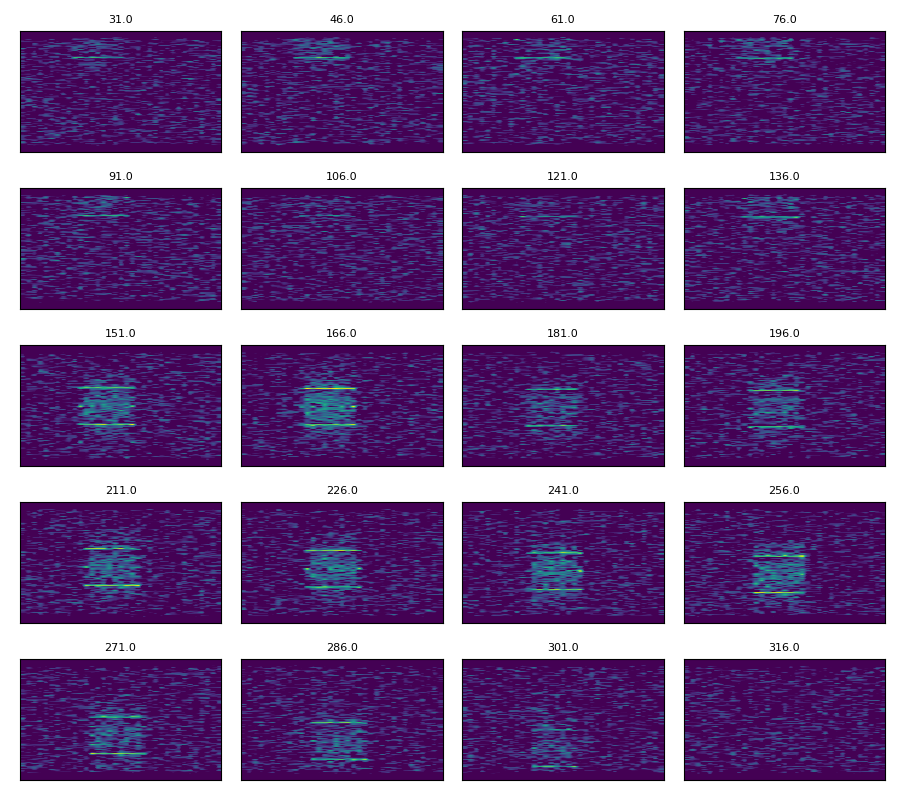

In [8]:
time = (31)*Fs

fig, axes = plt.subplots(figsize=(9,8), nrows=5, ncols=4)

for i in range(20):

    subset = data[int(time):int(time+0.75*Fs)]

    axes[int(i/4),i%4].set_title(f'{time/Fs:.1f}', fontsize=8)
    Pxx, freqs, bins, im = axes[int(i/4),i%4].specgram(subset, NFFT=NFFT, Fs=Fs, noverlap=0, vmax=-88, vmin=-108)
    axes[int(i/4),i%4].set_ylim(-8000,8000)
    axes[int(i/4),i%4].get_yaxis().set_visible(False)
    axes[int(i/4),i%4].get_xaxis().set_visible(False)
    
    time += 15*Fs
    
plt.tight_layout()

7968000.0


<IPython.core.display.Javascript object>


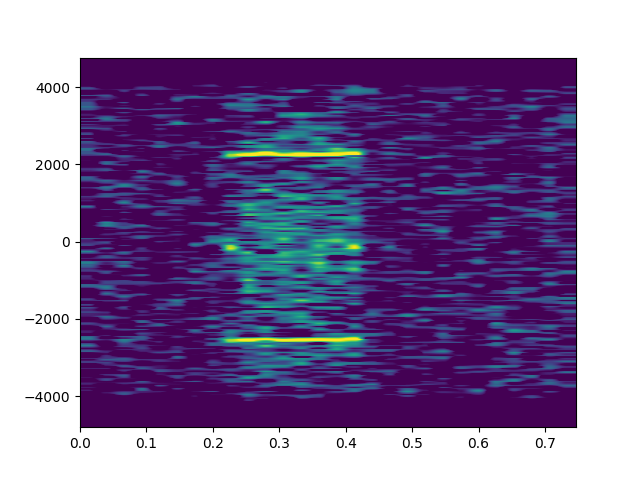

<IPython.core.display.Javascript object>


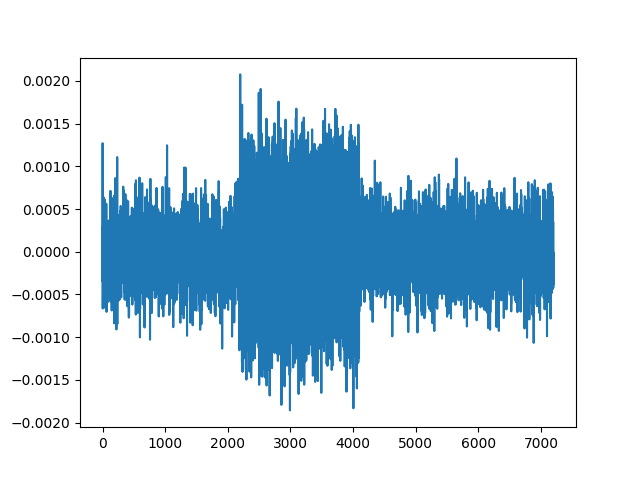

2.3973970559695488


c:\users\dryerzinia\documents\pcube\venv\lib\site-packages\numpy\core\_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


<IPython.core.display.Javascript object>


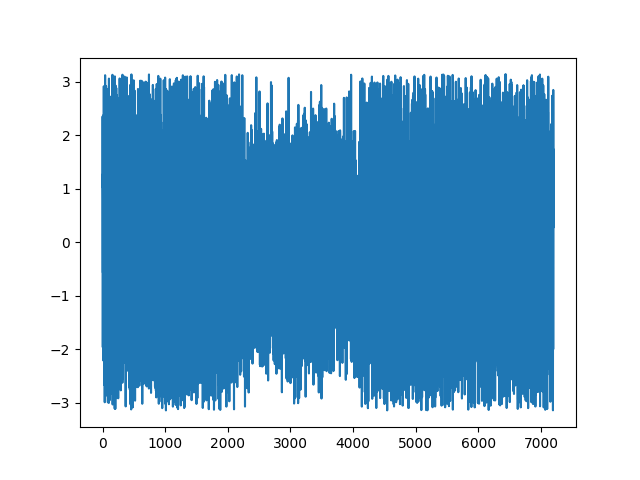

In [10]:
time = (31+9*15)*Fs

print(time)

subset = data[int(time):int(time+0.75*Fs)]

y = subset

#y = y * np.exp(-1.0j*2.0*np.pi* -3760/Fs*np.arange(len(y)))
y = signal.decimate(y, 5)

plt.figure()
Pxx, freqs, bins, im = plt.specgram(y, NFFT=256, Fs=Fs/5, noverlap=0, vmax=-88, vmin=-108)

plt.figure()
plt.plot(y)

noise = y[:2000]
sig = y[2000:4000]

noise_rms = np.sqrt(np.mean(noise**2))
signal_rms = np.sqrt(np.mean(sig**2))

noise_rms_power = noise_rms**2 / 50
signal_rms_power = signal_rms**2 / 50

print(10*np.log10(np.absolute(signal_rms_power/noise_rms_power)))

y = y[1::1] * np.conjugate(y[0:-1:1]);
y = np.angle(y);
plt.figure()
plt.plot(y)

In [11]:
data2 = np.fromfile('216820.IQ', dtype=np.csingle)

<IPython.core.display.Javascript object>


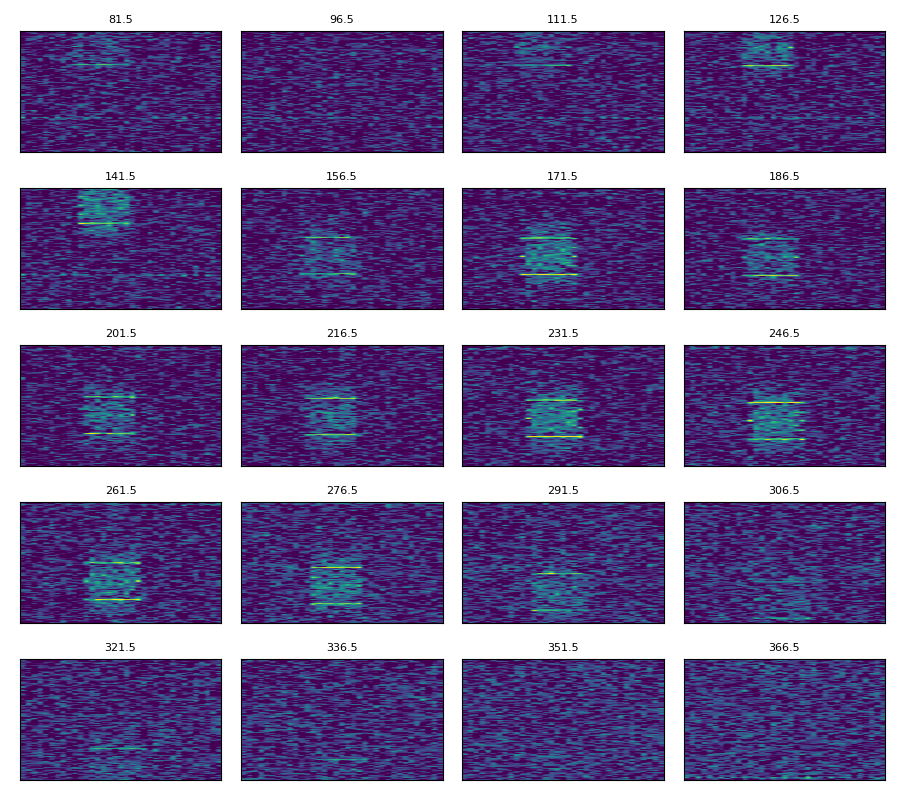

In [50]:
NFFT = 1024  # the length of the windowing segments

time = (81.5)*Fs

fig, axes = plt.subplots(figsize=(9,8), nrows=5, ncols=4)

for i in range(20):

    subset = data2[int(time):int(time+0.75*Fs)]

    axes[int(i/4),i%4].set_title(f'{time/Fs:.1f}', fontsize=8)
    Pxx, freqs, bins, im = axes[int(i/4),i%4].specgram(subset, NFFT=NFFT, Fs=Fs, noverlap=0, vmax=-88, vmin=-108)
    axes[int(i/4),i%4].set_ylim(-8000,8000)
    axes[int(i/4),i%4].get_yaxis().set_visible(False)
    axes[int(i/4),i%4].get_xaxis().set_visible(False)
    
    time += 15*Fs
    
plt.tight_layout()

12552000.0


<IPython.core.display.Javascript object>


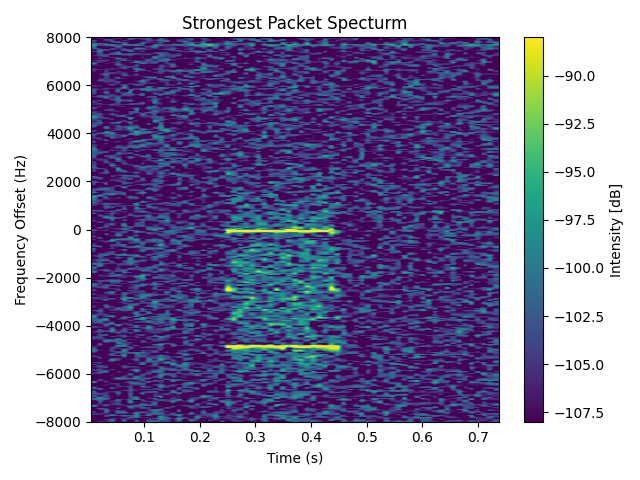

<ipython-input-25-3de3b035257d>:11: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = fig.add_subplot(111)


In [25]:
time = (81.5+12*15)*Fs

print(time)

subset = data2[int(time):int(time+0.75*Fs)]

fig = plt.figure()
plt.title("Strongest Packet Specturm")
plt.ylabel("Frequency Offset (Hz)")
plt.xlabel("Time (s)")
ax = fig.add_subplot(111)
Pxx, freqs, bins, im = ax.specgram(subset, NFFT=NFFT, Fs=Fs, noverlap=500, vmax=-88, vmin=-108)
ax.set_ylim(-8000,8000)
plt.colorbar(im).set_label('Intensity [dB]')
plt.tight_layout()

<IPython.core.display.Javascript object>


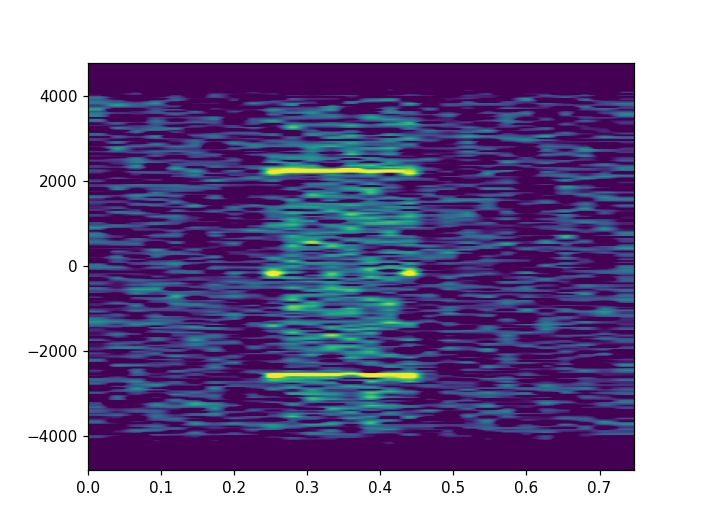

<IPython.core.display.Javascript object>


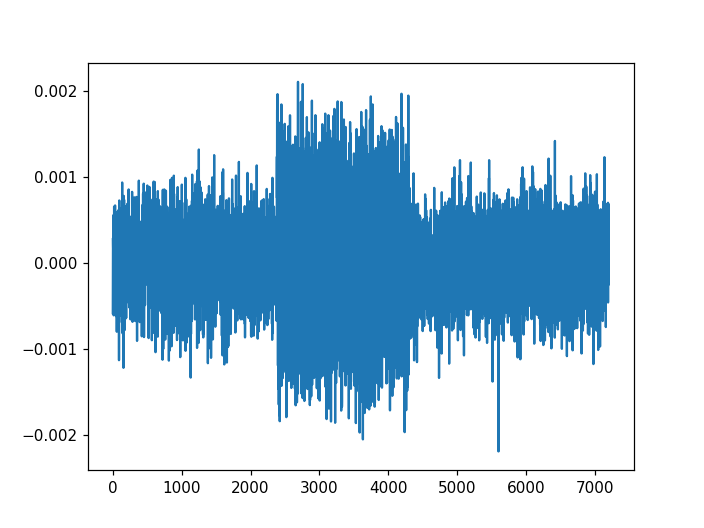

c:\users\dryerzinia\documents\pcube\venv\lib\site-packages\numpy\core\_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


<IPython.core.display.Javascript object>


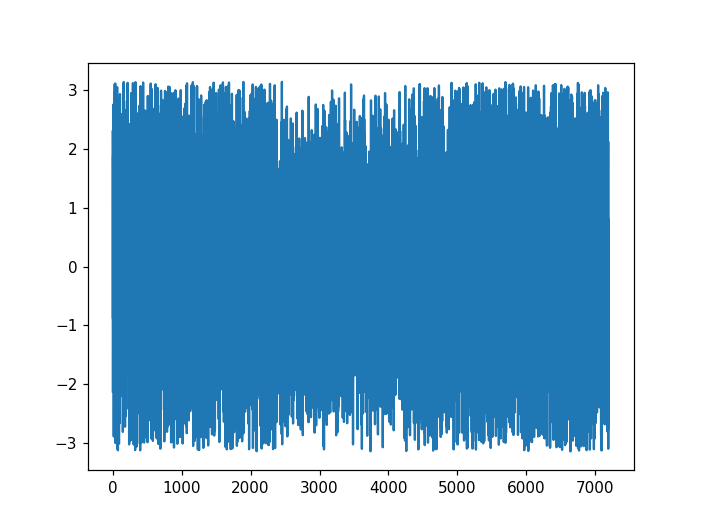

In [294]:
y = subset

y = y * np.exp(-1.0j*2.0*np.pi* -2300/Fs*np.arange(len(y)))
y = signal.decimate(y, 5)

plt.figure()
Pxx, freqs, bins, im = plt.specgram(y, NFFT=256, Fs=Fs/5, noverlap=0, vmax=-88, vmin=-108)

plt.figure()
plt.plot(y)

#plt.figure()
#plt.scatter(np.real(y), np.imag(y), color="red", alpha=0.05)

y = y[1::1] * np.conjugate(y[0:-1:1]);
y = np.angle(y);
plt.figure()
plt.plot(y)

In [88]:
data3 = np.fromfile('Test2.IQ', dtype=np.csingle)

<IPython.core.display.Javascript object>


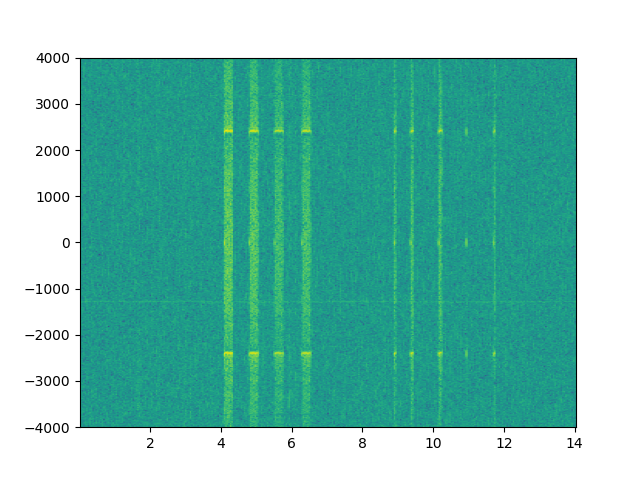

(-4000.0, 4000.0)

In [273]:
plt.figure()

Fs=12000

Pxx, freqs, bins, im = plt.specgram(data3, NFFT=NFFT, Fs=Fs, noverlap=500)#, vmax=-88, vmin=-108)
plt.ylim(-4000,4000)
#plt.plot(data3)

<IPython.core.display.Javascript object>


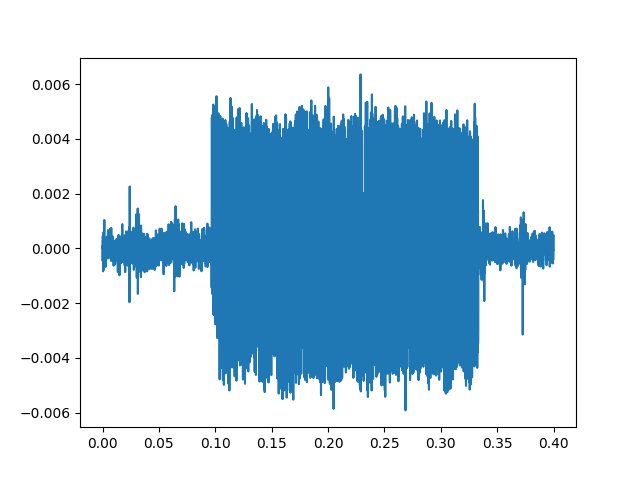

10.558818442259309


c:\users\dryerzinia\documents\pcube\venv\lib\site-packages\numpy\core\_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


In [291]:
plt.figure()
subset = data3[int(4.0*Fs):int(4.4*Fs)]
plt.plot(np.arange(0,len(subset))/Fs, subset)

noise = subset[int(0.0*Fs):int(0.075*Fs)]
signal = subset[int(0.15*Fs):int(0.225*Fs)]

noise_rms = np.sqrt(np.mean(noise**2))
signal_rms = np.sqrt(np.mean(signal**2))

noise_rms_power = noise_rms**2 / 50
signal_rms_power = signal_rms**2 / 50

print(10*np.log10(np.absolute(signal_rms_power/noise_rms_power)))

<IPython.core.display.Javascript object>


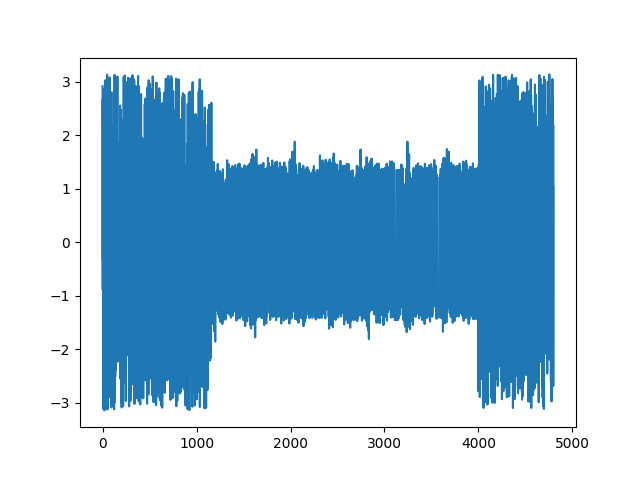

In [293]:
y = subset

#plt.figure()
#Pxx, freqs, bins, im = plt.specgram(y, NFFT=NFFT, Fs=Fs, noverlap=500)#, vmax=-88, vmin=-108)
#plt.ylim(-4000,4000)

y = y[1::1] * np.conjugate(y[0:-1:1]);
#y = (1.0 / 0.778) * np.angle(y);
y = np.angle(y);
#y = np.unwrap(y)

#N=4
#y = np.convolve(y, np.ones(N)/N, mode='valid')

plt.figure()
plt.plot(y)

In [56]:
data4 = np.fromfile('002b_2146_JAN31.IQ', dtype=np.csingle)
Fs=460800

In [57]:
n=18
subset = data4[(20*Fs)*n:(20*Fs)*(n+1)]

In [58]:
subset = subset * np.exp(-1.0j*2.0*np.pi* -150000/Fs*np.arange(len(subset)))
subset = signal.decimate(subset, 10)

<IPython.core.display.Javascript object>


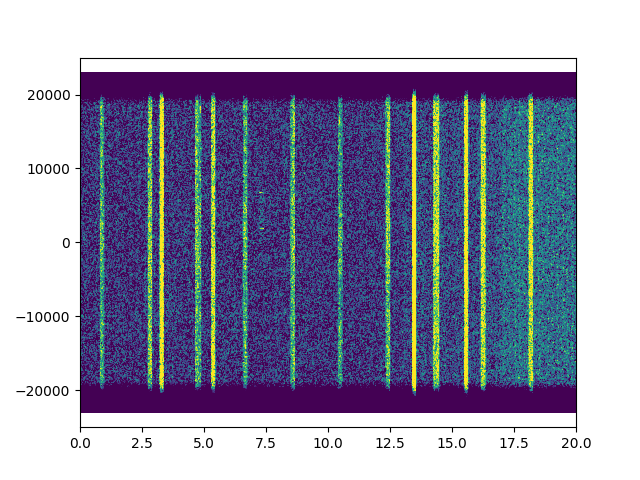

(-25000.0, 25000.0)

In [59]:
plt.figure()

Pxx, freqs, bins, im = plt.specgram(subset, NFFT=NFFT, Fs=Fs/10, noverlap=0, vmax=-112, vmin=-125)
plt.ylim(-25000,25000)

In [60]:
start = 306.95-15
length = 0.35
subset = data4[int(start*Fs):int((start+length)*Fs)]

<IPython.core.display.Javascript object>


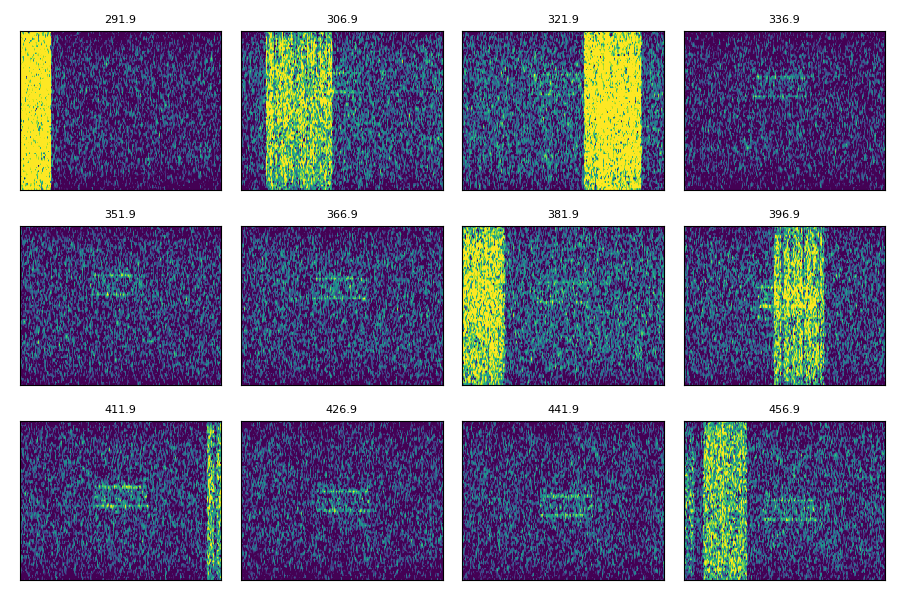

In [61]:
#y = subset
#y = y * np.exp(-1.0j*2.0*np.pi* -151000/Fs*np.arange(len(y)))

#nyq = 0.5 * Fs
#normalCutoff = 5e3 / nyq
#b, a = signal.butter(3, normalCutoff, btype='low')
#y = signal.lfilter(b, a, y)

#plt.figure()
#Pxx, freqs, bins, im = plt.specgram(y, NFFT=NFFT, Fs=Fs, noverlap=0, vmax=-112, vmin=-125)
#plt.ylim(-10000,10000)

time = start*Fs

w = 4
h = 3
fig, axes = plt.subplots(figsize=(9,6), nrows=h, ncols=w)

for i in range(int(w*h)):

    subset = data4[int(time):int(time+0.75*Fs)]

    y = subset
    y = y * np.exp(-1.0j*2.0*np.pi* -150000/Fs*np.arange(len(y)))
    
    nyq = 0.5 * Fs
    normalCutoff = 20e3 / nyq
    b, a = signal.butter(3, normalCutoff, btype='low')
    y = signal.lfilter(b, a, y)
    
    axes[int(i/w),i%w].set_title(f'{time/Fs:.1f}', fontsize=8)
    Pxx, freqs, bins, im = axes[int(i/w),i%w].specgram(y, NFFT=NFFT, Fs=Fs, noverlap=0, vmax=-112, vmin=-125)
    axes[int(i/w),i%w].set_ylim(-20000,20000)
    axes[int(i/w),i%w].get_yaxis().set_visible(False)
    axes[int(i/w),i%w].get_xaxis().set_visible(False)

    #axes[int(i/w)*2+1,i%w].plot(y)
    #axes[int(i/w)*2+1,i%w].get_yaxis().set_visible(False)
    #axes[int(i/w)*2+1,i%w].get_xaxis().set_visible(False)
    
    time += 15*Fs
    
plt.tight_layout()

456.95


<IPython.core.display.Javascript object>


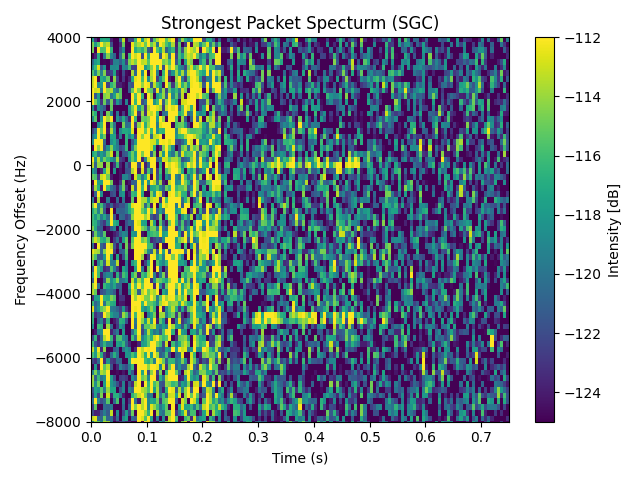

In [70]:
time = (start+11*15)*Fs

print(time/Fs)

subset = data4[int(time):int(time+0.75*Fs)]

y = subset
y = y * np.exp(-1.0j*2.0*np.pi* -150000/Fs*np.arange(len(y)))
y = signal.decimate(y, 10)

fig = plt.figure()
ax = fig.add_subplot(111)
plt.title("Strongest Packet Specturm (SGC)")
plt.ylabel("Frequency Offset (Hz)")
plt.xlabel("Time (s)")
Pxx, freqs, bins, im = ax.specgram(y, NFFT=256, Fs=Fs/10, noverlap=0, vmax=-112, vmin=-125)
ax.set_ylim(-8000,4000)
plt.colorbar(im).set_label('Intensity [dB]')
plt.tight_layout()

In [226]:
TLE_L1 = "2021-002B"
#TLE_L2 = "1 47310U 21002B   21032.58949637  .00002716  00000-0  13455-3 0  9996"
#TLE_L3 = "2 47310  60.6852  79.6674 0015143 303.2402  56.7236 15.20647900  2219"
TLE_L2 = "1 47310U 21002B   21030.55116039  .00003089  00000-0  15139-3 0  9998"
TLE_L3 = "2 47310  60.6852  87.2854 0015114 300.2477  59.7114 15.20637070  1901"

pass_length = len(data4)/Fs

dopplers = [
    [306.9,  7150],
    [321.9,  6570],
    [336.9,  5960],
    [351.9,  5200],
    [366.9,  4350],
    [381.9,  3320],
    [396.9,  2210],
    [411.9,  1090],
    [426.9,  -120],
    [441.9, -1210],
    [456.9, -2300]
]

#end_time = "2021-01-31 21:52:48.055387283 -0700"
end_time = "2021/2/1 04:52:48"

sat = ephem.readtle(TLE_L1, TLE_L2, TLE_L3)

ob = ephem.Observer()
ob.lon = '-105.261830556'
ob.lat = '40.0077027778'
ob.elevation = 1633

c = 299792458.0
f0 = 401.365e6

for dop in dopplers:

    seconds = pass_length - dop[0]

    ob.date = ephem.Date(end_time)-(seconds/60/60/24)
    #print(ob.date)
    sat.compute(ob)
    d_frequency = (c/(c+sat.range_velocity))*f0

    #print(f'Alt: {sat.alt}/Az: {sat.az}')
    d_shift = f0-d_frequency
    #print(d_shift)
    
    print(f'{dop[1] + d_shift:.0f} Hz')

761 Hz
704 Hz
721 Hz
708 Hz
730 Hz
694 Hz
682 Hz
726 Hz
697 Hz
751 Hz
723 Hz


<IPython.core.display.Javascript object>


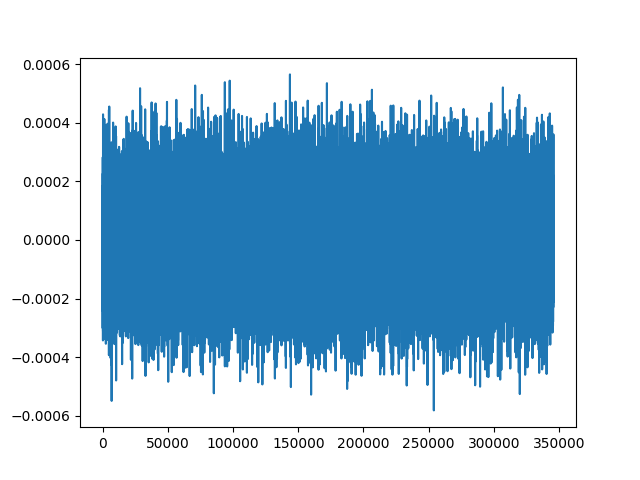

c:\users\dryerzinia\documents\pcube\venv\lib\site-packages\numpy\core\_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


In [653]:
plt.figure()
plt.plot(y)

In [166]:
data5 = np.fromfile('002j_2150_JAN31.IQ', dtype=np.csingle)
Fs=460800

In [167]:
n=1
subset = data5[(20*Fs)*n:(20*Fs)*(n+1)]

In [168]:
subset = subset * np.exp(-1.0j*2.0*np.pi* -151000/Fs*np.arange(len(subset)))
subset = signal.decimate(subset, 10)

<IPython.core.display.Javascript object>


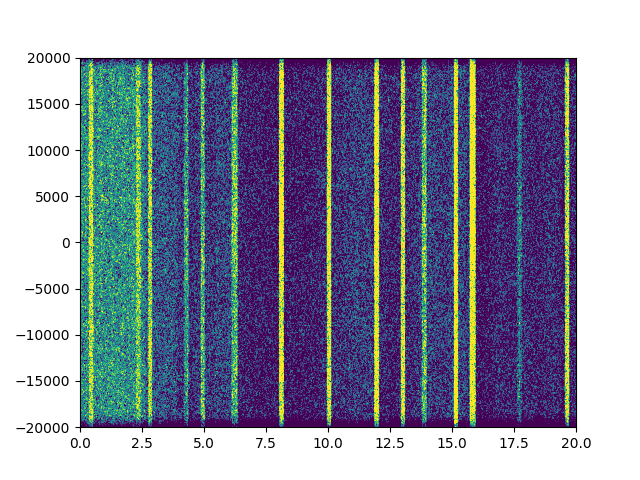

(-20000.0, 20000.0)

In [169]:
plt.figure()

Pxx, freqs, bins, im = plt.specgram(subset, NFFT=NFFT, Fs=Fs/10, noverlap=0, vmax=-112, vmin=-125)
plt.ylim(-20000,20000)

In [741]:
data6 = np.fromfile('02_01_2021_06_02_54_660.iq', dtype=np.byte)
data6 = data6.astype(float)
data6 = data6 - 127.5;
data6 = data6[0::2] + 1j*data6[1::2]
Fs=240000

139329536


In [835]:
n=16
subset = data6[(20*Fs)*n:(20*Fs)*(n+1)]
subset = signal.decimate(subset, 5)

<IPython.core.display.Javascript object>


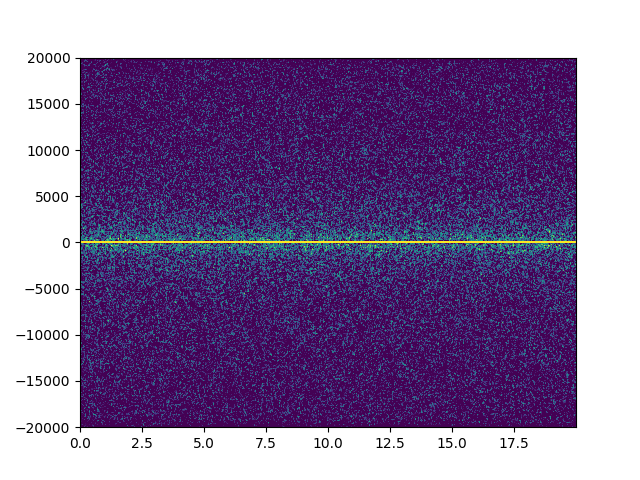

(-20000.0, 20000.0)

In [836]:
plt.figure()

Pxx, freqs, bins, im = plt.specgram(subset, NFFT=NFFT, Fs=Fs/5, noverlap=0, vmax=0, vmin=-10)
plt.ylim(-20000,20000)

In [2]:
data7 = np.fromfile('002b_0602_FEB01.IQ', dtype=np.csingle)
Fs=460800

<IPython.core.display.Javascript object>


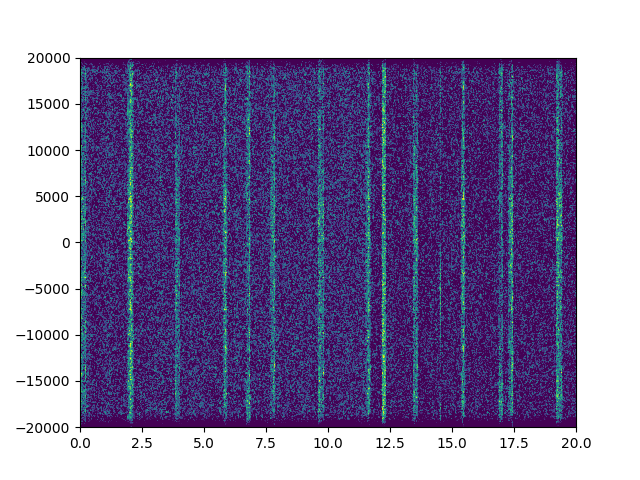

In [175]:
for n in range(10,11):

    subset = data7[(20*Fs)*n:(20*Fs)*(n+1)]

    subset = subset * np.exp(-1.0j*2.0*np.pi* -150000/Fs*np.arange(len(subset)))
    subset = signal.decimate(subset, 10)

    plt.figure()

    Pxx, freqs, bins, im = plt.specgram(subset, NFFT=NFFT, Fs=Fs/10, noverlap=0, vmax=-112, vmin=-125)
    plt.ylim(-20000,20000)

In [3]:
data7 = np.fromfile('002b_2126_FEB01.IQ', dtype=np.csingle)
Fs=460800

<IPython.core.display.Javascript object>


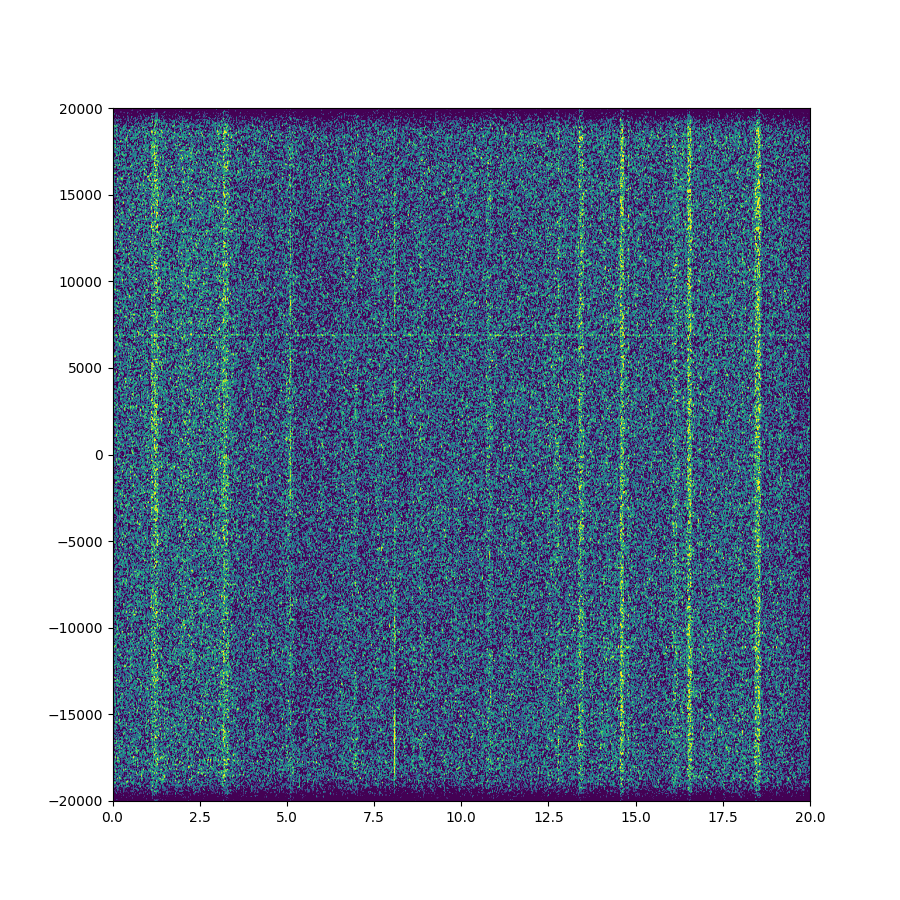

In [125]:
for n in [0]:

    subset = data7[(20*Fs)*n:(20*Fs)*(n+1)]

    subset = subset * np.exp(-1.0j*2.0*np.pi* -150000/Fs*np.arange(len(subset)))
    subset = signal.decimate(subset, 10)

    plt.figure(figsize=[9,9])

    Pxx, freqs, bins, im = plt.specgram(subset, NFFT=NFFT, Fs=Fs/10, noverlap=0, vmax=-112, vmin=-125)
    plt.ylim(-20000,20000)

In [90]:
data8 = np.fromfile('002k_2308_FEB01.IQ', dtype=np.csingle)
Fs=460800

<IPython.core.display.Javascript object>


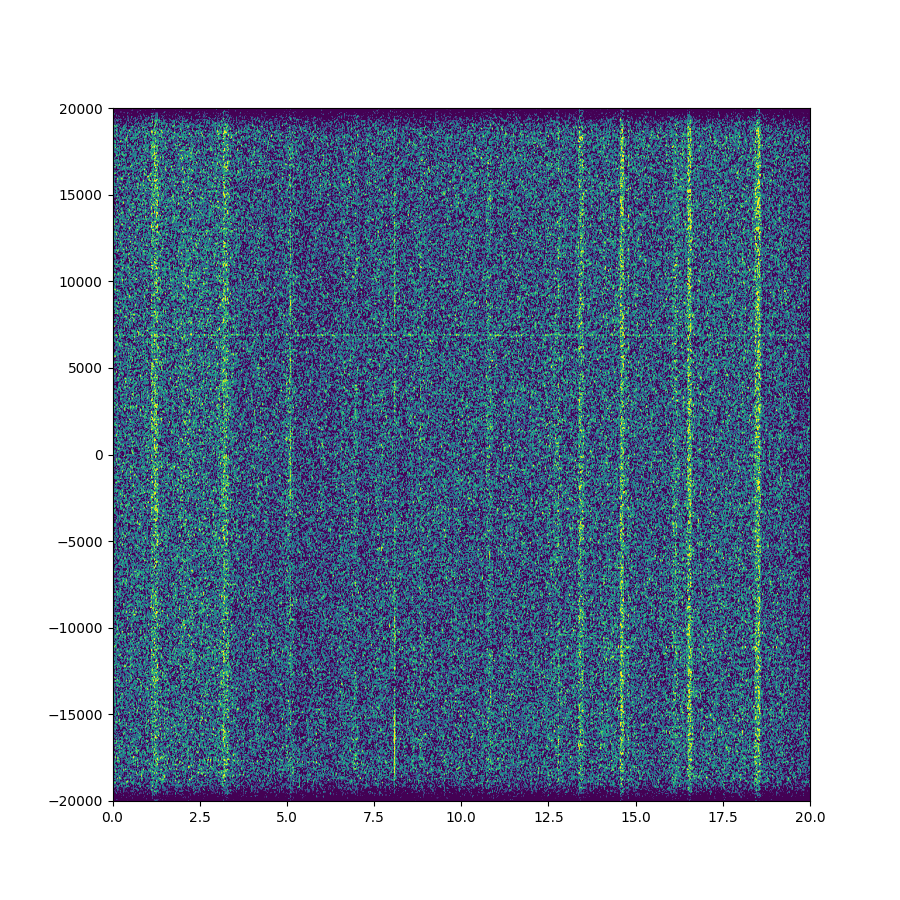

In [124]:
for n in [0]:

    subset = data7[(20*Fs)*n:(20*Fs)*(n+1)]

    subset = subset * np.exp(-1.0j*2.0*np.pi* -150000/Fs*np.arange(len(subset)))
    subset = signal.decimate(subset, 10)

    plt.figure(figsize=[9,9])

    Pxx, freqs, bins, im = plt.specgram(subset, NFFT=NFFT, Fs=Fs/10, noverlap=0, vmax=-112, vmin=-125)
    plt.ylim(-20000,20000)

In [27]:
data9 = np.fromfile('220103.IQ', dtype=np.csingle)
Fs = 48000

<IPython.core.display.Javascript object>


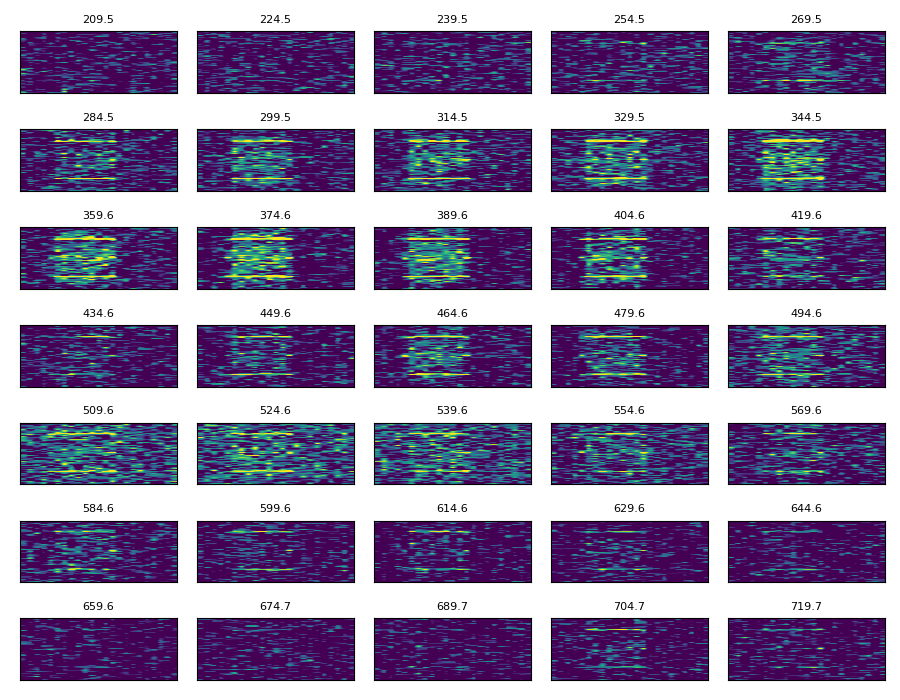

In [34]:
NFFT = 1024  # the length of the windowing segments

time = (14.5+13*15)*Fs

w = 5
h = 7

fig, axes = plt.subplots(figsize=(9,7), nrows=h, ncols=w)

for i in range(w*h):

    subset = data9[int(time):int(time+0.5*Fs)]

    axes[int(i/w),i%w].set_title(f'{time/Fs:.1f}', fontsize=8)
    Pxx, freqs, bins, im = axes[int(i/w),i%w].specgram(subset, NFFT=NFFT, Fs=Fs, noverlap=0, vmax=-95, vmin=-105)
    axes[int(i/w),i%w].set_ylim(-4700,3300)
    axes[int(i/w),i%w].get_yaxis().set_visible(False)
    axes[int(i/w),i%w].get_xaxis().set_visible(False)
    
    time += 15.005*Fs
    
plt.tight_layout()

16536000.0


<IPython.core.display.Javascript object>


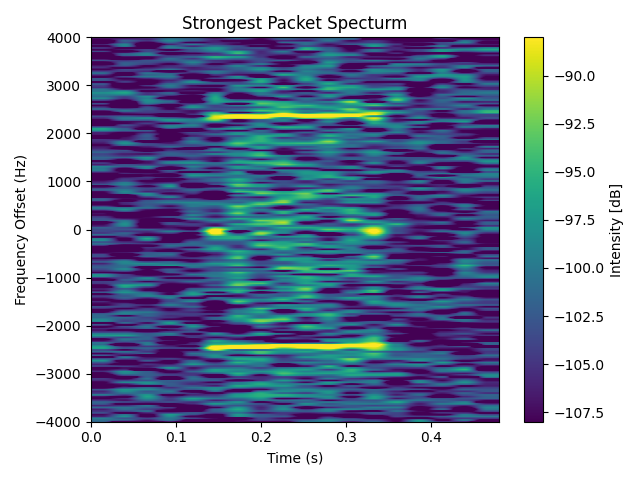

In [42]:
time = (344.5)*Fs

print(time)

subset = data9[int(time):int(time+0.5*Fs)]

y = subset

y = y * np.exp(-1.0j*2.0*np.pi* -620/Fs*np.arange(len(y)))
y = signal.decimate(y, 5)

fig = plt.figure()
ax = fig.add_subplot(111)
plt.title("Strongest Packet Specturm")
plt.ylabel("Frequency Offset (Hz)")
plt.xlabel("Time (s)")
Pxx, freqs, bins, im = ax.specgram(y, NFFT=256, Fs=Fs/5, noverlap=0, vmax=-88, vmin=-108)
ax.set_ylim(-4000,4000)
plt.colorbar(im).set_label('Intensity [dB]')
plt.tight_layout()

<IPython.core.display.Javascript object>


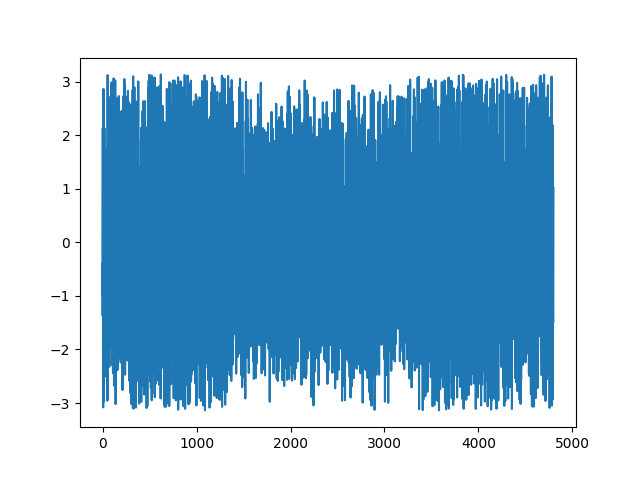

-0.9028643843751885


<IPython.core.display.Javascript object>


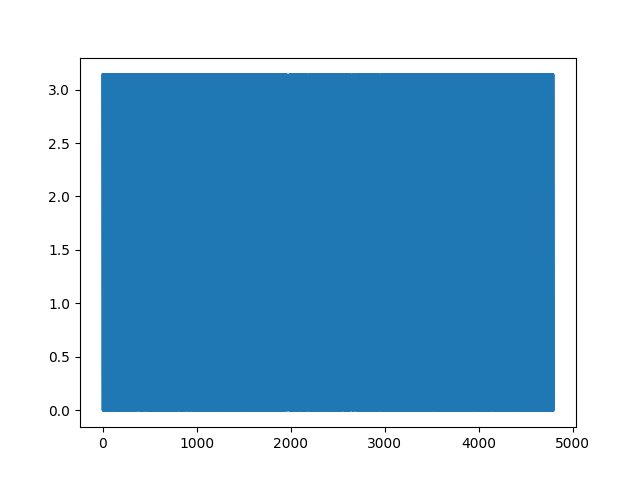

In [39]:
plt.figure()
plt.plot(y)

noise = y[:1000]
sig = y[2000:3000]

noise_rms = np.sqrt(np.mean(noise**2))
signal_rms = np.sqrt(np.mean(sig**2))

noise_rms_power = noise_rms**2 / 50
signal_rms_power = signal_rms**2 / 50

print(10*np.log10(np.absolute(signal_rms_power/noise_rms_power)))

#plt.figure()
#plt.scatter(np.real(y), np.imag(y), color="red", alpha=0.05)

y = y[1::1] * np.conjugate(y[0:-1:1]);
y = np.angle(y);
plt.figure()
plt.plot(y)

In [51]:
data10 = np.fromfile('220101.IQ', dtype=np.csingle)
Fs = 48000

<IPython.core.display.Javascript object>


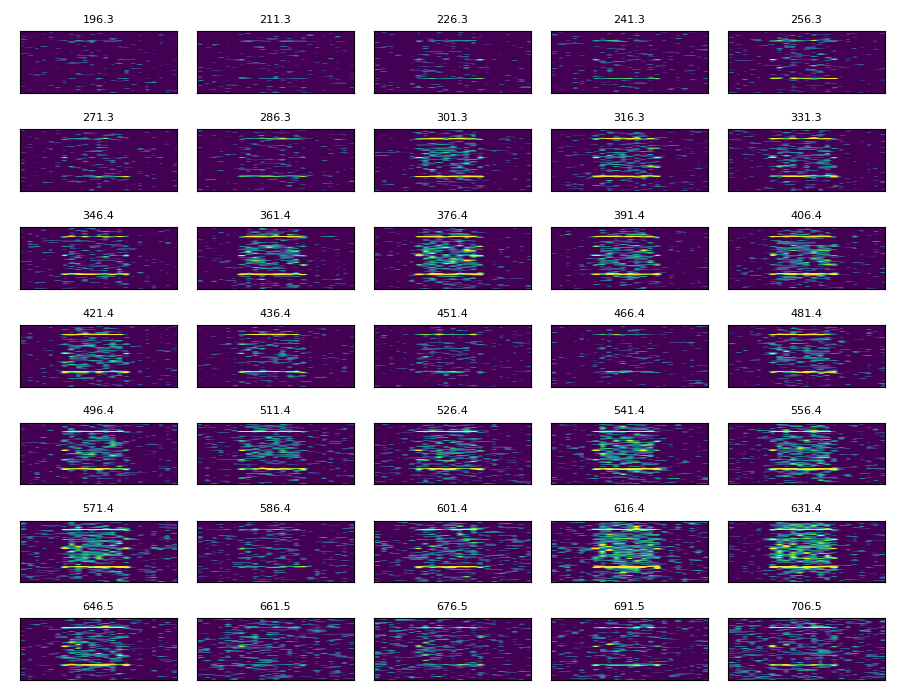

In [52]:
NFFT = 1024  # the length of the windowing segments

time = (16.3+12*15)*Fs

w = 5
h = 7

fig, axes = plt.subplots(figsize=(9,7), nrows=h, ncols=w)

for i in range(w*h):

    subset = data10[int(time):int(time+0.5*Fs)]

    axes[int(i/w),i%w].set_title(f'{time/Fs:.1f}', fontsize=8)
    Pxx, freqs, bins, im = axes[int(i/w),i%w].specgram(subset, NFFT=NFFT, Fs=Fs, noverlap=0, vmax=-95, vmin=-105)
    axes[int(i/w),i%w].set_ylim(-4000,4000)
    axes[int(i/w),i%w].get_yaxis().set_visible(False)
    axes[int(i/w),i%w].get_xaxis().set_visible(False)
    
    time += 15.005*Fs
    
plt.tight_layout()

In [318]:
data11 = np.fromfile('NOOR_0845_FEB02.IQ', dtype=np.csingle)
Fs=460800

<IPython.core.display.Javascript object>


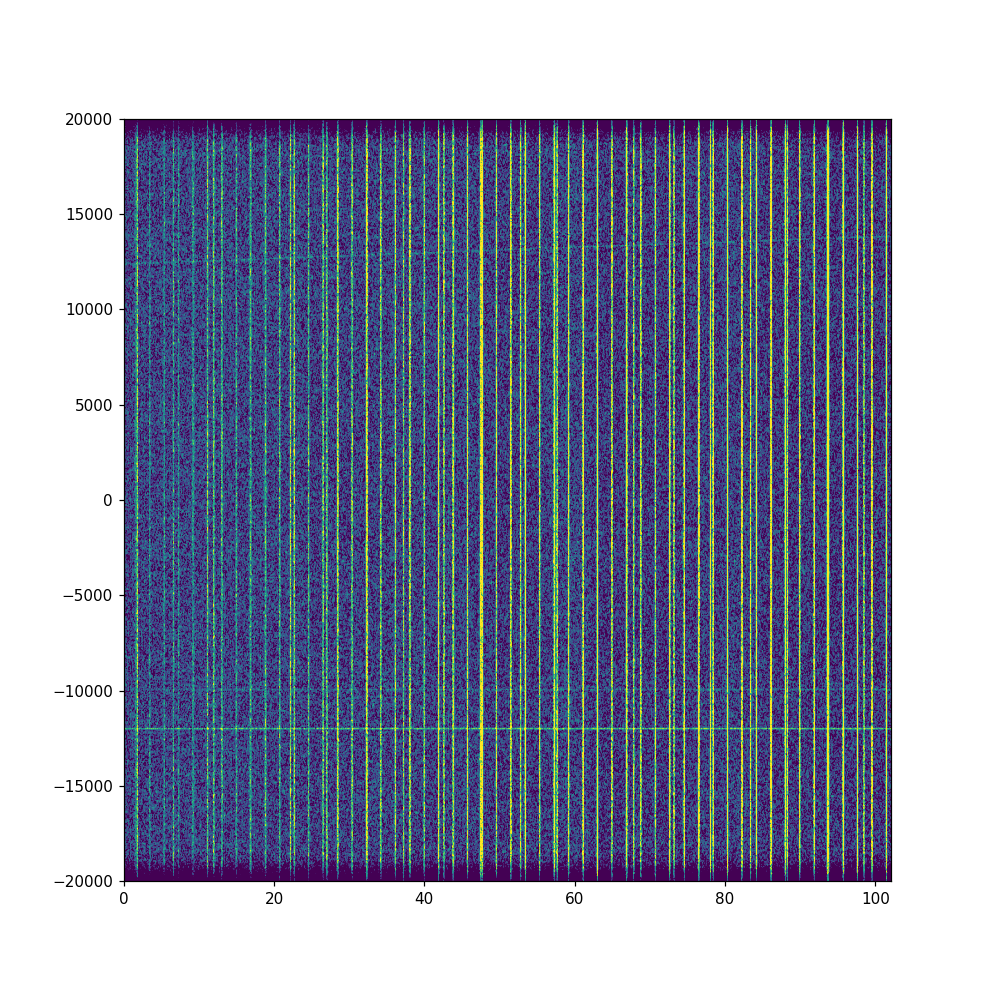

In [342]:
for n in [3]:

    subset = data11[(200*Fs)*n:(200*Fs)*(n+1)]

    subset = subset * np.exp(-1.0j*2.0*np.pi* -150000/Fs*np.arange(len(subset)))
    subset = signal.decimate(subset, 10)

    plt.figure(figsize=[9,9])

    Pxx, freqs, bins, im = plt.specgram(subset, NFFT=NFFT, Fs=Fs/10, noverlap=0, vmax=-112, vmin=-125)
    plt.ylim(-20000,20000)

In [357]:
f_clk = 25e6

def datarate_from_parameters(f_clk, datarate_m, datarate_e):
    return f_clk * (256 + datarate_m) * (2**datarate_e) / (2**28)

datarate_m = range(0, 255+1)
datarate_e = range(0, 15+1)

target_datarate = 300

best_datarate = 0
best_m = 0
best_e = 0

minimum_error = np.inf

for m in datarate_m:
    for e in datarate_e:
        datarate = datarate_from_parameters(f_clk, m, e)
        error = abs(target_datarate - datarate)
        if error < minimum_error:
            minimum_error = error
            best_datarate = datarate
            best_m = m
            best_e = e

print(best_datarate, best_m, best_e)

300.2583980560303 147 3


In [365]:
f_xo = 50e6

def fdev_from_parameters(f_xo, fdev_m, fdev_e):
    return f_xo * np.floor((8 + fdev_m) * 2**(fdev_e-1)) / (2**18)

fdev_m = range(0, 7+1)
fdev_e = range(0, 9+1)

target_fdev = 300/4

best_fdev = 0
best_m = 0
best_e = 0

minimum_error = np.inf

for m in fdev_m:
    for e in fdev_e:
        fdev = fdev_from_parameters(f_xo, m, e)
        error = abs(target_fdev - fdev)
        if error < minimum_error:
            minimum_error = error
            best_fdev = fdev
            best_m = m
            best_e = e
print(best_fdev, best_m, best_e)

762.939453125 0 0


In [1]:
import serial
import time

In [10]:
ser = serial.Serial("COM18", 115200, timeout=0.1)

In [12]:
ser.write(b"\xC0\x45\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x01\x01\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\xC0")
for i in range(36):
    data = ser.read(1)
    if len(data) > 0:
        print(format(data[0], '02X'))

C0
03
98
65
98
65
98
65
24
65
98
65
00
64
98
65
98
65
F8
64
98
65
98
65
98
65
98
65
98
65
98
65
50
65
C0


In [11]:
#for i in range(1):
ser.write(b"\xC0\x45\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x01\x01\x02\x00\x00\x00\x00\x00\x00\x8b\xc1\x00\x00\x00\x00Halp! I didn't Deploy!\xC0")
#    time.sleep(5)

52

In [9]:
ser.close()

In [86]:
data12 = np.fromfile('Test300Baud.IQ', dtype=np.csingle)
Fs=600

<IPython.core.display.Javascript object>


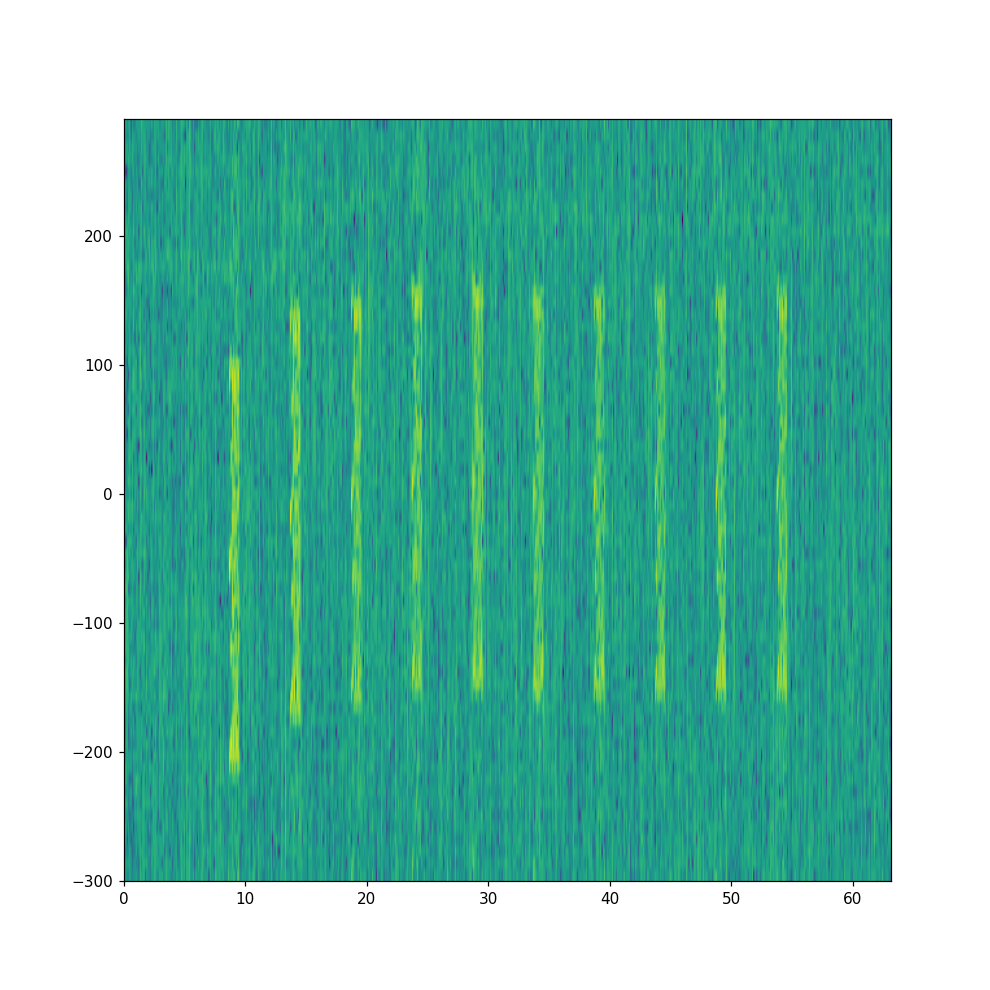

<IPython.core.display.Javascript object>


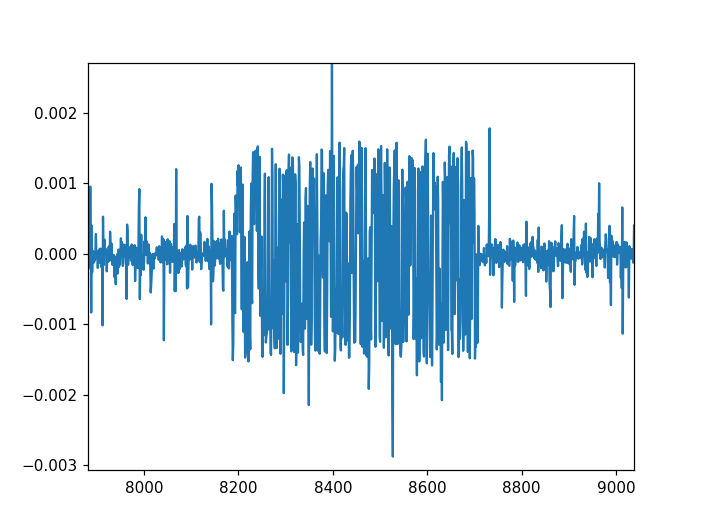

c:\users\dryerzinia\documents\pcube\venv\lib\site-packages\numpy\core\_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


In [92]:
subset = data12

plt.figure(figsize=[9,9])
Pxx, freqs, bins, im = plt.specgram(subset, NFFT=64, Fs=Fs, noverlap=0)#, vmax=-112, vmin=-125)

plt.figure()
plt.plot(subset)

In [97]:
data13 = np.fromfile('002B_2107_FEB02.IQ', dtype=np.csingle)
Fs=460800

<IPython.core.display.Javascript object>


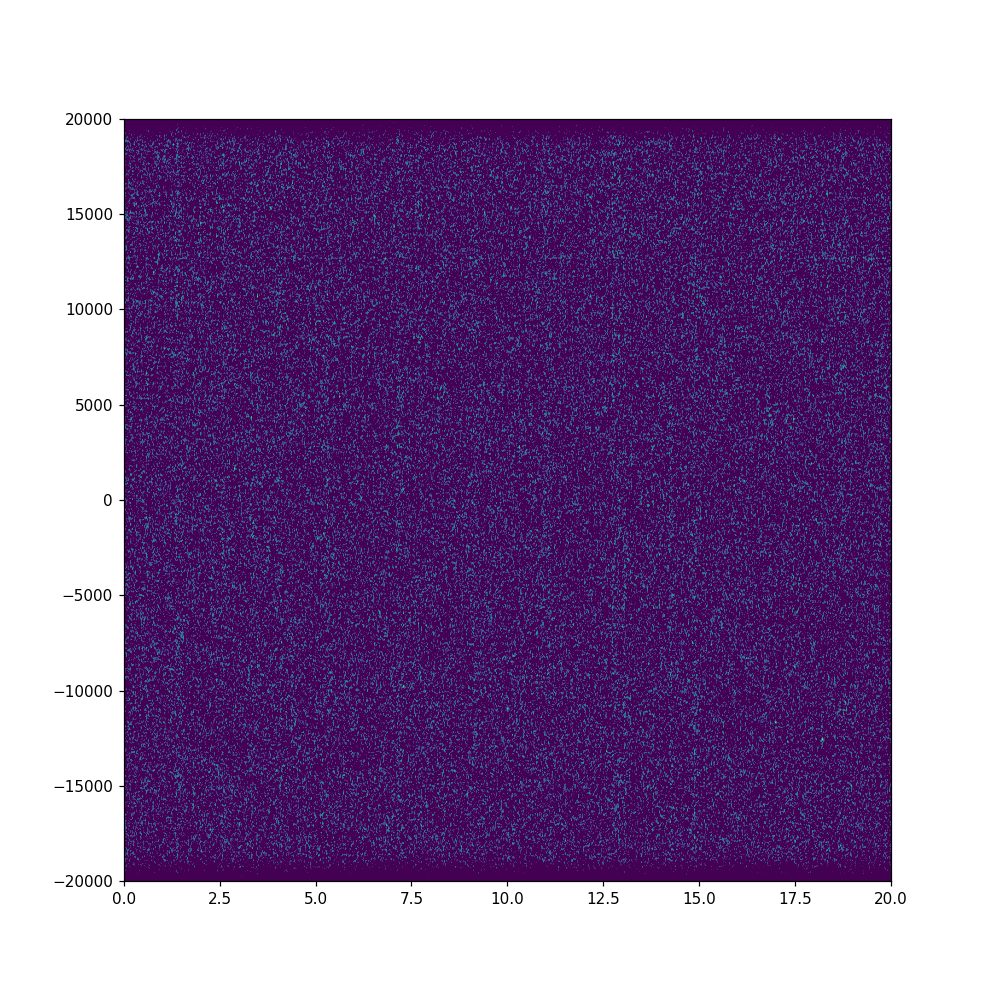

In [162]:
for n in [6]:

    subset = data13[(20*Fs)*n:(20*Fs)*(n+1)]

    subset = subset * np.exp(-1.0j*2.0*np.pi* -150000/Fs*np.arange(len(subset)))
    subset = signal.decimate(subset, 10)

    plt.figure(figsize=[9,9])

    Pxx, freqs, bins, im = plt.specgram(subset, NFFT=1024, Fs=Fs/10, noverlap=0, vmax=-112, vmin=-125)
    plt.ylim(-20000,20000)